# Agglomeration

##  Get agglomerations

In [1]:
# import osmnx as ox
import pandas as pd
import geopandas as gpd
import networkx as nx
import numpy as np
import warnings
import sys
import os
warnings.filterwarnings("ignore")
sys.stderr = open(os.devnull, 'w')

# local crs
local_crs = 32636

In [2]:
from popframe.models.region import Region

region_model = Region.from_pickle('data/Ленинградская область.pickle')
towns_gdf = gpd.read_file('data/spatial_inequality_gdf.geojson', engine="pyogrio").to_crs(32636)


In [3]:
towns_gdf = towns_gdf.reset_index().rename(columns={'index': 'id'})
towns_gdf

,id,provision,basic,additional,comfort,soc_workers_dev,soc_workers_soc,soc_workers_bas,soc_old_dev,soc_old_soc,...,soc_parents_dev,soc_parents_soc,soc_parents_bas,is_anchor_settlement,name,population,parent_id,parent_name,territory_id,geometry
0,0,0.443333,0.33,0.6,0.4,0,0.031308,0.615232,0.194644,0.079995,...,0.316945,0.031308,0.119223,False,деревня Болото,10.0,6.0,Борское сельское поселение,207,POINT (543142.339 6580637.744)
1,1,0.590000,0.67,0.7,0.4,0,0.031308,0.615232,0.194644,0.079995,...,0.316945,0.031308,0.119223,False,деревня Большой Остров,68.0,6.0,Борское сельское поселение,208,POINT (544532.929 6593228.214)
2,2,0.590000,0.67,0.7,0.4,0,0.031308,0.615232,0.194644,0.079995,...,0.316945,0.031308,0.119223,False,деревня Бор,1734.0,6.0,Борское сельское поселение,209,POINT (544895.402 6593052.876)
3,3,0.543333,0.53,0.7,0.4,0,0.031308,0.615232,0.194644,0.079995,...,0.316945,0.031308,0.119223,False,деревня Бороватое,10.0,6.0,Борское сельское поселение,210,POINT (543993.111 6589582.121)
4,4,0.333333,0.20,0.6,0.2,0,0.031308,0.615232,0.194644,0.079995,...,0.316945,0.031308,0.119223,False,деревня Бочево,10.0,6.0,Борское сельское поселение,211,POINT (538540.11 6576793.684)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2926,2926,0.266667,0.20,0.4,0.2,0,0.098783,0.744398,0.271781,0.097485,...,0.190276,0.098783,0.338247,False,деревня Апраксин Бор,313.0,205.0,Трубникоборское сельское поселение,3133,POINT (399059.742 6560341.471)
2927,2927,0.356667,0.27,0.4,0.4,0,0.098783,0.744398,0.271781,0.097485,...,0.190276,0.098783,0.338247,False,деревня Александровка,313.0,205.0,Трубникоборское сельское поселение,3134,POINT (403967.171 6562087.081)
2928,2928,0.290000,0.27,0.4,0.2,0,0.098783,0.744398,0.271781,0.097485,...,0.190276,0.098783,0.338247,False,деревня Большая Горка,313.0,205.0,Трубникоборское сельское поселение,3135,POINT (413116.74 6573793.279)
2929,2929,0.290000,0.27,0.4,0.2,0,0.098783,0.744398,0.271781,0.097485,...,0.190276,0.098783,0.338247,False,деревня Дроздово,5.0,205.0,Трубникоборское сельское поселение,3136,POINT (412458.032 6574811.307)


## Границы опорных пунктов

In [ ]:
from popframe.method.anchor_settlement import AnchorSettlementBuilder

import geopandas as gpd

# Создаем экземпляр класса
builder = AnchorSettlementBuilder(region=region_model)
# Приводим 'is_anchor_settlement' к булевому типу (если нужно)
towns_gdf["is_anchor_settlement"] = towns_gdf["is_anchor_settlement"].astype(bool)

# Вызываем метод построения границ
boundaries_gdf = builder.get_anchor_settlement_boundaries(towns_gdf)



In [5]:
boundaries_gdf

,type,anchor_settlements,geometry
0,Merged,"г. Мурино, г. Волосово, г. Сосновый Бор, г. Ки...","POLYGON ((217637.051 6612074.453, 217094.514 6..."
1,Merged,"г. Мурино, г. Волосово, г. Сосновый Бор, г. Ки...","POLYGON ((289689.513 6657437.201, 290634.788 6..."


In [ ]:
import geopandas as gpd
import numpy as np
import pandas as pd
from shapely.geometry import Polygon, MultiPolygon
from shapely.ops import unary_union
from geovoronoi import voronoi_regions_from_coords
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString
from shapely.ops import split

def split_multipolygons(geometry):
    """Разбивает MultiPolygon на отдельные полигоны и помечает все, кроме самого большого, как 'создан'."""
    if isinstance(geometry, MultiPolygon):
        sorted_polygons = sorted(geometry.geoms, key=lambda p: p.area, reverse=True)
        return [(sorted_polygons[0], "оригинал")] + [(poly, "создан") for poly in sorted_polygons[1:]]
    return [(geometry, "оригинал")]

def voronoi_polygons_within_boundaries(boundary_polygon, anchor_towns):
    """Создаёт диаграмму Вороного в пределах границ, а при двух точках использует разрезание."""
    
    # Фильтруем точки, оставляя только те, которые внутри границы
    points = [p for p in anchor_towns.geometry if boundary_polygon.contains(p)]
    
    if len(points) < 2:
        return gpd.GeoDataFrame(columns=['geometry', 'source'], crs=anchor_towns.crs)
    
    if len(points) == 2:
        # Если только 2 точки, делаем разрез границы на две части
        p1, p2 = points

        # Находим середину отрезка
        mid_x, mid_y = (p1.x + p2.x) / 2, (p1.y + p2.y) / 2

        # Направление перпендикуляра (90 градусов к прямой P1-P2)
        dx, dy = p2.x - p1.x, p2.y - p1.y
        perp_dx, perp_dy = -dy, dx  # Вектор перпендикуляра

        # Границы полигона
        min_x, min_y, max_x, max_y = boundary_polygon.bounds

        # Определяем длинную разрезающую линию, которая точно пересекает полигон
        cut_line = LineString([
            (mid_x - perp_dx * (max_x - min_x), mid_y - perp_dy * (max_y - min_y)), 
            (mid_x + perp_dx * (max_x - min_x), mid_y + perp_dy * (max_y - min_y))
        ])

        # Проверяем, что cut_line остается LineString
        if cut_line.geom_type == "MultiLineString":
            cut_line = list(cut_line.geoms)[0]  # Берем первый LineString

        # Разрезаем границу полигона
        split_polys = split(boundary_polygon, cut_line)

        if len(split_polys.geoms) == 2:
            return gpd.GeoDataFrame(
                {'geometry': list(split_polys.geoms), 'source': ["оригинал", "оригинал"]},
                crs=anchor_towns.crs
            )
        else:
            print("Ошибка разрезания границы на две части.")
            return gpd.GeoDataFrame(columns=['geometry', 'source'], crs=anchor_towns.crs)

    # Если точек больше 2, используем стандартную диаграмму Вороного
    points_array = np.array([(p.x, p.y) for p in points])
    region_polys, _ = voronoi_regions_from_coords(points_array, boundary_polygon)

    polygons = []
    sources = []
    for poly in region_polys.values():
        clipped_poly = poly.intersection(boundary_polygon)  # Обрезаем полигоны Вороного
        split_polys = split_multipolygons(clipped_poly)
        polygons.extend([p[0] for p in split_polys])
        sources.extend([p[1] for p in split_polys])
    
    return gpd.GeoDataFrame({'geometry': polygons, 'source': sources}, crs=anchor_towns.crs)

def find_largest_intersection(target_poly, gdf):
    """Находит полигон с наибольшей площадью пересечения с данным."""
    max_intersection = None
    max_area = 0
    max_index = None
    for idx, row in gdf.iterrows():
        intersection = target_poly.intersection(row.geometry)
        if not intersection.is_empty and intersection.area > max_area:
            max_intersection = row.geometry
            max_area = intersection.area
            max_index = idx
    return max_index, max_intersection

def cluster_and_merge_created_polygons(created_gdf):
    """Объединяет все пересекающиеся 'созданные' полигоны в кластеры."""
    merged_polygons = []
    processed = set()
    
    for idx, row in created_gdf.iterrows():
        if idx in processed:
            continue
        
        cluster = created_gdf[created_gdf.geometry.intersects(row.geometry)].geometry.tolist()
        merged_polygons.append(unary_union(cluster))
        processed.update(created_gdf[created_gdf.geometry.intersects(row.geometry)].index)
    
    return gpd.GeoDataFrame({'geometry': merged_polygons, 'source': 'создан'}, crs=created_gdf.crs)

def merge_created_polygons(voronoi_gdf):
    """Объединяет полигоны 'создан' между собой, а затем с полигоном 'оригинал' с наибольшей площадью пересечения.
       Если полигон получает статус 'объединён', удаляет оригинал."""
    created_gdf = voronoi_gdf[voronoi_gdf['source'] == "создан"].copy()
    original_gdf = voronoi_gdf[voronoi_gdf['source'] == "оригинал"].copy()
    
    # Кластеризация созданных полигонов
    clustered_created_gdf = cluster_and_merge_created_polygons(created_gdf)
    
    merged_geometries = []
    original_to_remove = set()
    
    for _, row in clustered_created_gdf.iterrows():
        buffered_geom = row.geometry.buffer(30)  # Буфер перед объединением с оригиналом
        max_index, max_intersection_poly = find_largest_intersection(buffered_geom, original_gdf)
        
        if max_intersection_poly:
            merged_geometry = unary_union([buffered_geom, max_intersection_poly])
            original_to_remove.add(max_index)
        else:
            merged_geometry = buffered_geom
        
        merged_geometries.append(merged_geometry)
    
    # Удаляем оригиналы, которые были объединены
    original_gdf = original_gdf.drop(index=original_to_remove)
    
    merged_gdf = gpd.GeoDataFrame({'geometry': merged_geometries, 'source': 'объединён'}, crs=voronoi_gdf.crs)
    
    return gpd.GeoDataFrame(pd.concat([original_gdf, merged_gdf], ignore_index=True))


def final_simplification(merged_gdf):
    """Уменьшает геометрию на буфер 30 и объединяет пересекающиеся полигоны в один."""
    shrunk_geometries = merged_gdf.geometry.buffer(-30)
    final_geometry = unary_union(shrunk_geometries)

    # Создаем GeoSeries и применяем explode()
    exploded_geometry = gpd.GeoSeries(final_geometry).explode(index_parts=False)
    exploded_geometry = exploded_geometry.buffer(30)
    # Создаем GeoDataFrame с разбиением MultiPolygon на отдельные Polygon
    final_gdf = gpd.GeoDataFrame({'geometry': exploded_geometry, 'source': 'финальный'}, crs=merged_gdf.crs)

    # Сброс индекса после разбиения
    final_gdf = final_gdf.reset_index(drop=True)

    return final_gdf

def merge_gdfs_excluding_intersections(boundaries_gdf, final_gdf, anchor_towns):
    """
    Объединяет boundaries_gdf и final_gdf, исключая пересекающиеся полигоны, 
    и для каждого полученного полигона назначает имя из anchor_towns, если внутри него найдена такая точка.
    В результирующем GeoDataFrame остаются только атрибуты 'geometry' и 'name'.

    Parameters:
    boundaries_gdf (GeoDataFrame): Исходные границы.
    final_gdf (GeoDataFrame): Итоговые полигоны.
    anchor_towns (GeoDataFrame): Точки с городами, содержащие атрибут 'name'.

    Returns:
    GeoDataFrame: Объединённый результат с атрибутами 'geometry' и 'name'.
    """
    
    # Удаляем полигоны из boundaries_gdf, которые пересекаются с final_gdf
    filtered_boundaries_gdf = boundaries_gdf[~boundaries_gdf.intersects(final_gdf.unary_union)]
    
    # Объединяем оставшиеся полигоны с final_gdf
    merged_gdf = gpd.GeoDataFrame(pd.concat([filtered_boundaries_gdf, final_gdf], ignore_index=True))
    
    # Создаем новый столбец 'name', который будет содержать имя города из anchor_towns
    merged_gdf["name"] = None
    
    # Для каждого полигона ищем, какие объекты из anchor_towns находятся внутри
    for idx, row in merged_gdf.iterrows():
        # Выбираем все точки, которые содержатся в полигоне
        towns_in_poly = anchor_towns[anchor_towns.within(row.geometry)]
        if not towns_in_poly.empty:
            # Присваиваем имя первого найденного города
            merged_gdf.at[idx, "anchor_name"] = towns_in_poly.iloc[0]["name"]
    
    # Оставляем только столбцы 'geometry' и 'name'
    merged_gdf = merged_gdf[["geometry", "anchor_name"]]
    
    return merged_gdf


# Разделяем на две группы
non_anchor_towns = towns_gdf[towns_gdf["is_anchor_settlement"] == False]  # Не опорные города
anchor_towns = towns_gdf[towns_gdf["is_anchor_settlement"] == True]  # Опорные города

voronoi_gdfs = []

for boundary_geom in boundaries_gdf.geometry:  # Берем только геометрию границ
    voronoi_gdf = voronoi_polygons_within_boundaries(boundary_geom, anchor_towns)
    voronoi_gdfs.append(voronoi_gdf)

# Объединяем все полученные геодатафреймы в один
voronoi_gdf = gpd.GeoDataFrame(pd.concat(voronoi_gdfs, ignore_index=True))

# Объединение полигонов
merged_voronoi_gdf = merge_created_polygons(voronoi_gdf)

# Финальная обработка
final_gdf = final_simplification(merged_voronoi_gdf)


result_gdf = merge_gdfs_excluding_intersections(boundaries_gdf, final_gdf, anchor_towns)

Недостаточно точек внутри границы для построения диаграммы Вороного.


In [7]:
result_gdf

,geometry,anchor_name
0,"POLYGON ((289689.513 6657437.201, 290634.788 6...",г. Сосновый Бор
1,"POLYGON ((290833.832 6542488.141, 290833.493 6...",г. Луга
2,"POLYGON ((197917.925 6549729.864, 197918.01 65...",г. Сланцы
3,"POLYGON ((219178.207 6603388.048, 219177.62 66...",г. Ивангород
4,"POLYGON ((245201.346 6566229.279, 245200.705 6...",г. Кингисепп
5,"POLYGON ((272515.486 6623019.177, 272514.956 6...",г. Волосово
6,"POLYGON ((310526.399 6632540.812, 310527.12 66...",г. Гатчина
7,"POLYGON ((211862.284 6627365.69, 211862.356 66...",п. Усть-Луга
8,"POLYGON ((359656.173 6637951.473, 359656.203 6...",г. Кудрово
9,"POLYGON ((363617.334 6650929.139, 363615.753 6...",NaN


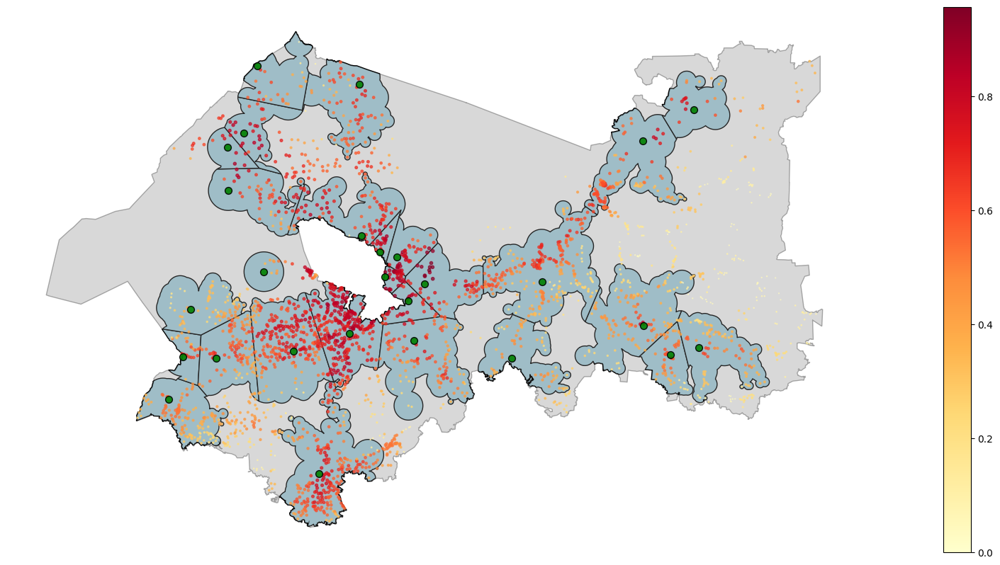

In [8]:
import matplotlib.pyplot as plt
import geopandas as gpd
import contextily as ctx

# Создание графика и оси
fig, ax = plt.subplots(figsize=(30, 10))

# Визуализация границ с заливкой светло-голубым цветом
result_gdf.plot(ax=ax, edgecolor="black", facecolor="#ADD8E6", linewidth=1)

# Визуализация границ региона (серым цветом с прозрачностью)
region_boundary = region_model.region
region_boundary.plot(ax=ax, color='gray', edgecolor='black', alpha=0.3)

# Визуализация не опорных городов (тепловая карта по provision)
non_anchor_towns.plot(
    ax=ax, 
    column="provision",  # Градиент по 'provision'
    cmap="YlOrRd",  # От жёлтого к красному
    legend=True,  # Включаем легенду
    markersize=non_anchor_towns["provision"] * 10,  # Размер точек по значению
    alpha=0.7
)

# Визуализация опорных городов (зелёным цветом)
anchor_towns.plot(
    ax=ax,
    color="green",  # Фиксированный зелёный цвет
    markersize=50,  # Размер маркеров
    alpha=0.9,
    edgecolor="black"
)


# Настройки отображения
ax.set_axis_off()

# Показ графика
plt.show()


In [9]:


# Визуализация границ
m = result_gdf.explore(color="black")

# Визуализация не опорных городов (тепловая карта по provision)
m = non_anchor_towns.explore(
    m=m,
    column="provision",  # Градиент по 'provision'
    cmap="YlOrRd",  # От жёлтого к красному
    legend=True,  # Включаем легенду
    tooltip=["name", "provision"],  # Всплывающие подсказки
)

# Визуализация опорных городов (зелёным цветом)
m = anchor_towns.explore(
    m=m,
    color="green",  # Фиксированный зелёный цвет
    marker_kwds={"radius": 7},  # Размер маркеров
    tooltip="name",  # Всплывающая подсказка с названием города
)

# Показываем карту
m

## Пространственное неравенство

In [10]:
gpsp_spatial_inequality_gdf = gpd.read_file('data/gpsp_spatial_inequality.geojson', engine="pyogrio")
gpsp_spatial_inequality_gdf = gpsp_spatial_inequality_gdf.to_crs(32636)
gpsp_spatial_inequality_gdf.head()

,territory_id,name,provision,basic,additional,comfort,soc_workers_dev,soc_workers_soc,soc_workers_bas,soc_old_dev,soc_old_soc,soc_old_bas,soc_parents_dev,soc_parents_soc,soc_parents_bas,soc_workers_mean,soc_old_mean,soc_parents_mean,geometry
0,3,Самойловское сельское поселение,0.350544,0.298571,0.532653,0.220408,0.0,0.044208,0.764966,0.102202,0.066979,0.369065,0.328068,0.044208,0.191597,0.269725,0.179416,0.187958,"POLYGON ((580049.515 6617067.72, 580225.344 66..."
1,4,Большедворское сельское поселение,0.370544,0.242245,0.514286,0.355102,0.0,0.043945,0.763465,0.129648,0.062886,0.365862,0.700643,0.045833,0.169462,0.269137,0.186132,0.305313,"POLYGON ((573514.444 6620389.851, 573579.919 6..."
2,5,Пикалевское городское поселение,0.753333,0.830000,0.970000,0.460000,0.0,0.042534,0.689387,0.010915,0.051922,0.321286,0.355989,0.042534,0.134538,0.243974,0.128041,0.177687,"POLYGON ((564707.328 6594903.594, 564341.814 6..."
3,6,Борское сельское поселение,0.398495,0.343871,0.548387,0.303226,0.0,0.031308,0.615232,0.194644,0.079995,0.049687,0.316945,0.031308,0.119223,0.215513,0.108109,0.155825,"POLYGON ((560629.509 6557332.762, 560642.857 6..."
4,7,Бокситогорское городское поселение,0.576061,0.615455,0.701818,0.410909,0.0,0.055679,0.849328,0.027587,0.087237,0.596788,0.344600,0.055679,0.179343,0.301669,0.237204,0.193207,"POLYGON ((560659.317 6585430.874, 559919.213 6..."


In [11]:
towns = towns_gdf[["geometry", "population", "id", "territory_id"]]
towns

,geometry,population,id,territory_id
0,POINT (543142.339 6580637.744),10.0,0,207
1,POINT (544532.929 6593228.214),68.0,1,208
2,POINT (544895.402 6593052.876),1734.0,2,209
3,POINT (543993.111 6589582.121),10.0,3,210
4,POINT (538540.11 6576793.684),10.0,4,211
...,...,...,...,...
2926,POINT (399059.742 6560341.471),313.0,2926,3133
2927,POINT (403967.171 6562087.081),313.0,2927,3134
2928,POINT (413116.74 6573793.279),313.0,2928,3135
2929,POINT (412458.032 6574811.307),5.0,2929,3136


In [12]:
import geopandas as gpd
import pandas as pd
import numpy as np

# Список столбцов с оценками, которые нужно распределить
score_cols = [
    'provision', 'basic', 'additional', 'comfort',
    'soc_workers_dev', 'soc_workers_soc', 'soc_workers_bas',
    'soc_old_dev', 'soc_old_soc', 'soc_old_bas',
    'soc_parents_dev', 'soc_parents_soc', 'soc_parents_bas',
    'soc_workers_mean', 'soc_old_mean', 'soc_parents_mean'
]

# Копия GeoDataFrame с городами для записи распределённых оценок
towns_result = towns.copy()

# Инициализируем новые столбцы для распределённых оценок
for col in score_cols:
    towns_result[col] = np.nan

# Задаём запас, чтобы оценки не получались ровно 0 или 1
eps = 1e-6

# Проходим по каждому полигону из gpsp_spatial_inequality_gdf
for poly_idx, poly in gpsp_spatial_inequality_gdf.iterrows():
    poly_geom = poly.geometry

    # Выбираем города, которые полностью лежат внутри полигона
    towns_in_poly = towns_result[towns_result.within(poly_geom)]

    # Если городов в полигоне нет или суммарное население равно 0 — пропускаем
    if towns_in_poly.empty:
        continue

    if (towns_in_poly['population'] <= 0).all():
        continue

    # Для каждого оценочного столбца рассчитываем распределение
    for col in score_cols:
        polygon_score = poly[col]
        # Если значение оценок полигона не лежит в (eps, 1-eps), оставляем его без изменений
        if not (eps < polygon_score < 1 - eps):
            towns_result.loc[towns_in_poly.index, col] = polygon_score
            continue

        # Нормализуем население внутри полигона: r_i от 0 до 1
        pop = towns_in_poly['population']
        pop_min = pop.min()
        pop_max = pop.max()

        # Если все города имеют одинаковое население, просто присваиваем polygon_score
        if pop_max == pop_min:
            towns_result.loc[towns_in_poly.index, col] = polygon_score
            continue

        r = (pop - pop_min) / (pop_max - pop_min)
        mean_r = r.mean()

        # Вычисляем максимально допустимый delta, чтобы итоговые оценки не вышли за (eps, 1-eps)
        # Для города с максимальным r_i (r_i = 1): s_max = polygon_score + delta*(1 - mean_r) <= 1 - eps
        delta_max_pos = (1 - polygon_score - eps) / (1 - mean_r) if (1 - mean_r) > 0 else np.inf
        # Для города с минимальным r_i (r_i = 0): s_min = polygon_score - delta*(mean_r) >= eps
        delta_max_neg = (polygon_score - eps) / (mean_r) if mean_r > 0 else np.inf

        delta = min(delta_max_pos, delta_max_neg)

        # Вычисляем итоговую оценку для каждого города
        computed_scores = polygon_score + delta * (r - mean_r)
        # Обеспечиваем, чтобы значения точно были в диапазоне (eps, 1-eps)
        computed_scores = computed_scores.clip(lower=eps, upper=1-eps)

        # Записываем вычисленные оценки в towns_result
        towns_result.loc[towns_in_poly.index, col] = computed_scores

# В towns_result для каждого города распределены оценки так, что:
# - их простое среднее внутри полигона равно polygon_score,
# - объекты с большим населением (бóльшим нормированным значением r) получают более высокие оценки,
# - все итоговые оценки лежат в диапазоне (eps, 1-eps).

towns_result

,geometry,population,id,territory_id,provision,basic,additional,comfort,soc_workers_dev,soc_workers_soc,soc_workers_bas,soc_old_dev,soc_old_soc,soc_old_bas,soc_parents_dev,soc_parents_soc,soc_parents_bas,soc_workers_mean,soc_old_mean,soc_parents_mean
0,POINT (543142.339 6580637.744),10.0,0,207,0.364096,0.306349,0.522561,0.263379,0.0,0.000333,0.593228,0.148588,0.027382,0.000528,0.277883,0.000333,0.068854,0.170651,0.057104,0.107549
1,POINT (544532.929 6593228.214),68.0,1,208,0.385490,0.329685,0.538623,0.288161,0.0,0.019597,0.606913,0.177232,0.060103,0.031101,0.302177,0.019597,0.100180,0.198552,0.088825,0.137574
2,POINT (544895.402 6593052.876),1734.0,2,209,0.999999,0.999999,0.999999,0.999999,0.0,0.572944,0.999999,0.999999,0.999999,0.909294,0.999999,0.572944,0.999999,0.999999,0.999999,0.999999
3,POINT (543993.111 6589582.121),10.0,3,210,0.364096,0.306349,0.522561,0.263379,0.0,0.000333,0.593228,0.148588,0.027382,0.000528,0.277883,0.000333,0.068854,0.170651,0.057104,0.107549
4,POINT (538540.11 6576793.684),10.0,4,211,0.364096,0.306349,0.522561,0.263379,0.0,0.000333,0.593228,0.148588,0.027382,0.000528,0.277883,0.000333,0.068854,0.170651,0.057104,0.107549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2926,POINT (399059.742 6560341.471),313.0,2926,3133,0.442088,0.332291,0.487458,0.487458,0.0,0.113926,0.767099,0.313442,0.112428,0.375041,0.219443,0.113926,0.390096,0.324144,0.266970,0.241155
2927,POINT (403967.171 6562087.081),313.0,2927,3134,0.442088,0.332291,0.487458,0.487458,0.0,0.113926,0.767099,0.313442,0.112428,0.375041,0.219443,0.113926,0.390096,0.324144,0.266970,0.241155
2928,POINT (413116.74 6573793.279),313.0,2928,3135,0.442088,0.332291,0.487458,0.487458,0.0,0.113926,0.767099,0.313442,0.112428,0.375041,0.219443,0.113926,0.390096,0.324144,0.266970,0.241155
2929,POINT (412458.032 6574811.307),5.0,2929,3136,0.032953,0.000001,0.111594,0.111594,0.0,0.000001,0.596305,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001


In [13]:
import geopandas as gpd
import numpy as np

# Список столбцов с оценками, по которым будем брать среднее
score_cols = [
    'provision', 'basic', 'additional', 'comfort',
    'soc_workers_dev', 'soc_workers_soc', 'soc_workers_bas',
    'soc_old_dev', 'soc_old_soc', 'soc_old_bas',
    'soc_parents_dev', 'soc_parents_soc', 'soc_parents_bas',
    'soc_workers_mean', 'soc_old_mean', 'soc_parents_mean'
]

# Создаём копию result_gdf для записи новых оценок
result_gdf_copy = result_gdf.copy()

# Добавляем в result_gdf_copy столбцы для оценок (инициализируем NaN)
for col in score_cols:
    result_gdf_copy[col] = np.nan

# Проходим по каждому полигону в result_gdf_copy
for idx, poly in result_gdf_copy.iterrows():
    poly_geom = poly.geometry
    # Отбираем города, которые полностью находятся внутри полигона
    towns_in_poly = towns_result[towns_result.within(poly_geom)]
    
    # Если городов внутри полигона нет, переходим к следующему
    if towns_in_poly.empty:
        continue
    
    # Для каждого оценочного столбца вычисляем среднее значение по городам внутри полигона
    for col in score_cols:
        mean_score = towns_in_poly[col].mean()
        result_gdf_copy.loc[idx, col] = mean_score

# Результирующий GeoDataFrame с перенесёнными оценками
result_gdf_copy


,geometry,anchor_name,provision,basic,additional,comfort,soc_workers_dev,soc_workers_soc,soc_workers_bas,soc_old_dev,soc_old_soc,soc_old_bas,soc_parents_dev,soc_parents_soc,soc_parents_bas,soc_workers_mean,soc_old_mean,soc_parents_mean
0,"POLYGON ((289689.513 6657437.201, 290634.788 6...",г. Сосновый Бор,0.372684,0.298391,0.433709,0.385950,0.0,0.015679,0.617852,0.015717,0.025553,0.176648,0.198143,0.015679,0.135360,0.127888,0.054679,0.084490
1,"POLYGON ((290833.832 6542488.141, 290833.493 6...",г. Луга,0.571502,0.439987,0.698718,0.575799,0.0,0.049401,0.585387,0.130409,0.067134,0.233380,0.311150,0.049401,0.180965,0.211706,0.143895,0.180410
2,"POLYGON ((197917.925 6549729.864, 197918.01 65...",г. Сланцы,0.398430,0.410900,0.358381,0.426009,0.0,0.054682,0.677263,0.241084,0.078262,0.260477,0.473287,0.054691,0.141657,0.242893,0.192698,0.222246
3,"POLYGON ((219178.207 6603388.048, 219177.62 66...",г. Ивангород,0.477999,0.375592,0.617078,0.441328,0.0,0.056162,0.513832,0.078975,0.209968,0.230206,0.288102,0.056162,0.170782,0.171743,0.170447,0.170476
4,"POLYGON ((245201.346 6566229.279, 245200.705 6...",г. Кингисепп,0.516238,0.408525,0.579856,0.560333,0.0,0.064521,0.722670,0.097836,0.113500,0.395889,0.233975,0.064521,0.237305,0.272368,0.204176,0.181092
5,"POLYGON ((272515.486 6623019.177, 272514.956 6...",г. Волосово,0.614650,0.489270,0.646765,0.707915,0.0,0.030697,0.744971,0.043061,0.048459,0.375243,0.246876,0.030697,0.223024,0.256977,0.155740,0.166593
6,"POLYGON ((310526.399 6632540.812, 310527.12 66...",г. Гатчина,0.746379,0.672006,0.819417,0.747713,0.0,0.039129,0.723727,0.047107,0.055998,0.365629,0.229692,0.039129,0.345859,0.258068,0.157469,0.206414
7,"POLYGON ((211862.284 6627365.69, 211862.356 66...",п. Усть-Луга,0.355855,0.353295,0.362820,0.351449,0.0,0.313118,0.505625,0.192774,0.338960,0.472895,0.305912,0.313118,0.217286,0.274223,0.335027,0.278544
8,"POLYGON ((359656.173 6637951.473, 359656.203 6...",г. Кудрово,0.828357,0.785863,0.901324,0.797884,0.0,0.010163,0.726043,0.016374,0.014206,0.334614,0.075307,0.010163,0.230258,0.235491,0.111422,0.101835
9,"POLYGON ((363617.334 6650929.139, 363615.753 6...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
import geopandas as gpd
import pandas as pd
import numpy as np
import folium

# Список столбцов с оценками
score_cols = [
    'provision', 'basic', 'additional', 'comfort',
    'soc_workers_dev', 'soc_workers_soc', 'soc_workers_bas',
    'soc_old_dev', 'soc_old_soc', 'soc_old_bas',
    'soc_parents_dev', 'soc_parents_soc', 'soc_parents_bas',
    'soc_workers_mean', 'soc_old_mean', 'soc_parents_mean'
]

# 1. Трансформация: вычитаем оценки из 1 для result_gdf_copy и towns_result
for col in score_cols:
    result_gdf_copy[col] = result_gdf_copy[col].apply(lambda x: 1 - x if pd.notnull(x) else x)
    towns_result[col] = towns_result[col].apply(lambda x: 1 - x if pd.notnull(x) else x)

# Предполагаем, что CRS у towns_result и result_gdf_copy одинаковые.
# Если это не так, приведите их к единой системе координат, например:
# towns_result = towns_result.to_crs(epsg=4326)
# result_gdf_copy = result_gdf_copy.to_crs(epsg=4326)

# Создаём булеву маску: для каждого города проверяем, пересекается ли его геометрия хотя бы с одним полигоном
inside_mask = towns_result.geometry.apply(lambda pt: result_gdf_copy.intersects(pt).any())

# Разбиваем на две группы
inside_towns = towns_result[inside_mask]
outside_towns = towns_result[~inside_mask]

# Выводим статистику по каждому атрибуту
print("Средние оценки для городов ВНУТРИ полигонов:")
for col in score_cols:
    mean_inside = inside_towns[col].mean()
    print(f"{col}: {mean_inside:.4f}")

print("\nСредние оценки для городов ВНЕ полигонов:")
for col in score_cols:
    mean_outside = outside_towns[col].mean()
    print(f"{col}: {mean_outside:.4f}")

# 3. Визуализация
# Задаём атрибут для раскраски
selected_attribute = "provision"

# Получаем списки атрибутов для tooltip (без 'geometry')
tooltip_fields_poly = [col for col in result_gdf_copy.columns if col != 'geometry']
tooltip_fields_towns = [col for col in towns_result.columns if col != 'geometry']

# Визуализируем полигональный слой (result_gdf_copy)
m = result_gdf_copy.explore(
    column=selected_attribute,   # Раскраска по выбранному атрибуту
    cmap="YlOrRd",               # Цветовая карта
    legend=True,
    tooltip=tooltip_fields_poly
)

# Добавляем слой с городами (towns_result)
m = towns_result.explore(
    m=m,
    column=selected_attribute,   # Раскраска по тому же атрибуту
    cmap="YlOrRd",
    legend=True,
    tooltip=tooltip_fields_towns
)

m


Средние оценки для городов ВНУТРИ полигонов:
provision: 0.4613
basic: 0.5295
additional: 0.3659
comfort: 0.4885
soc_workers_dev: 1.0000
soc_workers_soc: 0.9376
soc_workers_bas: 0.3263
soc_old_dev: 0.8868
soc_old_soc: 0.9131
soc_old_bas: 0.6728
soc_parents_dev: 0.6669
soc_parents_soc: 0.9375
soc_parents_bas: 0.7769
soc_workers_mean: 0.7536
soc_old_mean: 0.8242
soc_parents_mean: 0.7935

Средние оценки для городов ВНЕ полигонов:
provision: 0.6782
basic: 0.7195
additional: 0.6428
comfort: 0.6723
soc_workers_dev: 1.0000
soc_workers_soc: 0.9300
soc_workers_bas: 0.3702
soc_old_dev: 0.7483
soc_old_soc: 0.8946
soc_old_bas: 0.6998
soc_parents_dev: 0.5744
soc_parents_soc: 0.9300
soc_parents_bas: 0.8078
soc_workers_mean: 0.7715
soc_old_mean: 0.7818
soc_parents_mean: 0.7720


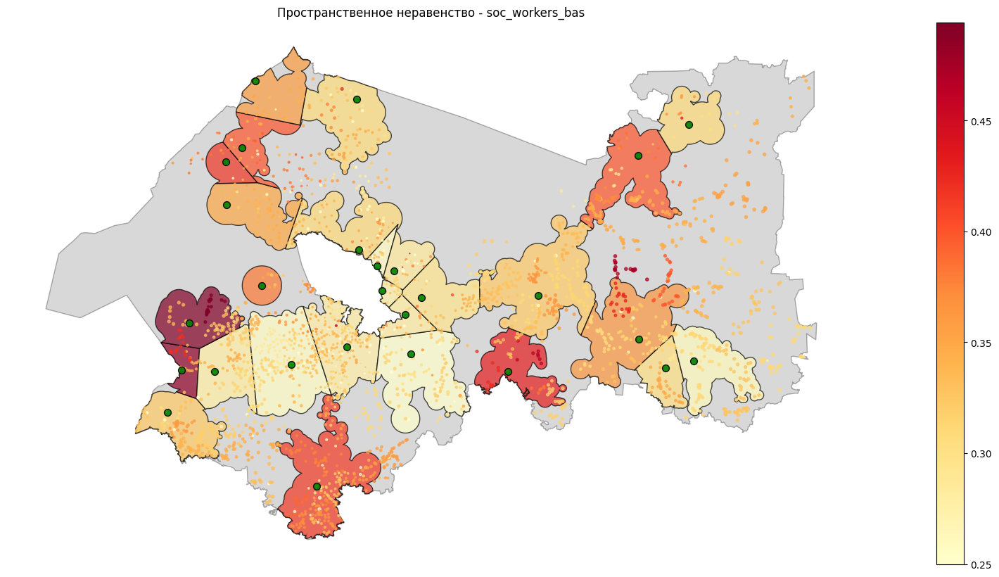

In [17]:
import matplotlib.pyplot as plt
import geopandas as gpd
import contextily as ctx

# Создание графика и оси
fig, ax = plt.subplots(figsize=(30, 10))


# Визуализация границ региона (серым цветом с прозрачностью)
region_boundary = region_model.region
region_boundary.plot(ax=ax, color='gray', edgecolor='black', alpha=0.3)

# Визуализация границ с заливкой по 'provision'
result_gdf_copy.plot(
    ax=ax,
    column="soc_workers_bas",  # Градиент по 'provision'
    cmap="YlOrRd",  # От жёлтого к красному
    edgecolor="black",
    linewidth=1,
    legend=True,
    alpha=0.7
)

# Визуализация не опорных городов (тепловая карта по provision)
towns_result.plot(
    ax=ax, 
    column="soc_workers_bas",  # Градиент по 'provision'
    cmap="YlOrRd",  # От жёлтого к красному
    legend=False,  # Включаем легенду
    markersize=towns_result["provision"] * 10,  # Размер точек по значению
    alpha=0.7
)

# Визуализация опорных городов (зелёным цветом)
anchor_towns.plot(
    ax=ax,
    color="green",  # Фиксированный зелёный цвет
    markersize=50,  # Размер маркеров
    alpha=0.9,
    edgecolor="black"
)

# Настройки отображения
ax.set_title("Пространственное неравенство - soc_workers_bas")
ax.set_axis_off()

# Показ графика
plt.show()


In [16]:
towns_result

,geometry,population,id,territory_id,provision,basic,additional,comfort,soc_workers_dev,soc_workers_soc,soc_workers_bas,soc_old_dev,soc_old_soc,soc_old_bas,soc_parents_dev,soc_parents_soc,soc_parents_bas,soc_workers_mean,soc_old_mean,soc_parents_mean
0,POINT (543142.339 6580637.744),10.0,0,207,0.635904,0.693651,0.477439,0.736621,1.0,0.999667,0.406772,0.851412,0.972618,0.999472,0.722117,0.999667,0.931146,0.829349,0.942896,0.892451
1,POINT (544532.929 6593228.214),68.0,1,208,0.614510,0.670315,0.461377,0.711839,1.0,0.980403,0.393087,0.822768,0.939897,0.968899,0.697823,0.980403,0.899820,0.801448,0.911175,0.862426
2,POINT (544895.402 6593052.876),1734.0,2,209,0.000001,0.000001,0.000001,0.000001,1.0,0.427056,0.000001,0.000001,0.000001,0.090706,0.000001,0.427056,0.000001,0.000001,0.000001,0.000001
3,POINT (543993.111 6589582.121),10.0,3,210,0.635904,0.693651,0.477439,0.736621,1.0,0.999667,0.406772,0.851412,0.972618,0.999472,0.722117,0.999667,0.931146,0.829349,0.942896,0.892451
4,POINT (538540.11 6576793.684),10.0,4,211,0.635904,0.693651,0.477439,0.736621,1.0,0.999667,0.406772,0.851412,0.972618,0.999472,0.722117,0.999667,0.931146,0.829349,0.942896,0.892451
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2926,POINT (399059.742 6560341.471),313.0,2926,3133,0.557912,0.667709,0.512542,0.512542,1.0,0.886074,0.232901,0.686558,0.887572,0.624959,0.780557,0.886074,0.609904,0.675856,0.733030,0.758845
2927,POINT (403967.171 6562087.081),313.0,2927,3134,0.557912,0.667709,0.512542,0.512542,1.0,0.886074,0.232901,0.686558,0.887572,0.624959,0.780557,0.886074,0.609904,0.675856,0.733030,0.758845
2928,POINT (413116.74 6573793.279),313.0,2928,3135,0.557912,0.667709,0.512542,0.512542,1.0,0.886074,0.232901,0.686558,0.887572,0.624959,0.780557,0.886074,0.609904,0.675856,0.733030,0.758845
2929,POINT (412458.032 6574811.307),5.0,2929,3136,0.967047,0.999999,0.888406,0.888406,1.0,0.999999,0.403695,0.999999,0.999999,0.999999,0.999999,0.999999,0.999999,0.999999,0.999999,0.999999
